In [1]:
import scanpy as sc
import pandas as pd
import numpy as np
import mudata as md
import seaborn as sns
from matplotlib import pyplot as plt
from matplotlib import cm
import matplotlib.colors as mcolors

import matplotlib as mpl
import muon as mu
import glob
import warnings
import os

C:\Users\jacquelines\anaconda3\envs\panpipes\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
plt.rcParams["font.family"] = "DejaVu Sans"

In [3]:
def intersection(lst1, lst2):
    lst3 = [value for value in lst1 if value in lst2]
    return lst3

# Import data

In [ ]:
mdata = md.read(r'LEGACY1_annotated.h5mu')

C:\Users\jacquelines\anaconda3\envs\panpipes\lib\site-packages\anndata\_core\anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(
C:\Users\jacquelines\anaconda3\envs\panpipes\lib\site-packages\anndata\_core\anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


In [51]:
t_mdata = md.read(r'LEGACY1_annotated_Tcellclustered.h5mu')

C:\Users\jacquelines\anaconda3\envs\panpipes\lib\site-packages\anndata\_core\anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(
C:\Users\jacquelines\anaconda3\envs\panpipes\lib\site-packages\anndata\_core\anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(
C:\Users\jacquelines\anaconda3\envs\panpipes\lib\site-packages\anndata\_core\anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


In [4]:
b_mdata = md.read(r'LEGACY1_annotated_Bcellclustered.h5mu')

C:\Users\jacquelines\anaconda3\envs\panpipes\lib\site-packages\anndata\_core\anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(
C:\Users\jacquelines\anaconda3\envs\panpipes\lib\site-packages\anndata\_core\anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(
C:\Users\jacquelines\anaconda3\envs\panpipes\lib\site-packages\anndata\_core\anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


In [18]:
m_mdata = md.read(r'LEGACY1_annotated_Myeloidclustered.h5mu')

C:\Users\jacquelines\anaconda3\envs\panpipes\lib\site-packages\anndata\_core\anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(
C:\Users\jacquelines\anaconda3\envs\panpipes\lib\site-packages\anndata\_core\anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(
C:\Users\jacquelines\anaconda3\envs\panpipes\lib\site-packages\anndata\_core\anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


# Full data figures

In [3]:
palette_broadcelltype = ["#00AFBB", # B cells
                         "#E7B800", # Myeloid
                         "#FC4E07" # T cells
                        ]

In [8]:
# Total cell counts
totalcounts_broad = mdata['rna'].obs['broad_celltype'].value_counts()
totalcounts_broad

broad_celltype
T_cell     99212
B_cell     86137
Myeloid     5917
Name: count, dtype: int64

In [10]:
# Total cell counts
totalcounts_fine = mdata['rna'].obs['celltype'].value_counts()
totalcounts_fine.to_csv("TotalCellCounts_fine.csv")

C:\Users\jacquelines\anaconda3\envs\panpipes\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\jacquelines\anaconda3\envs\panpipes\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


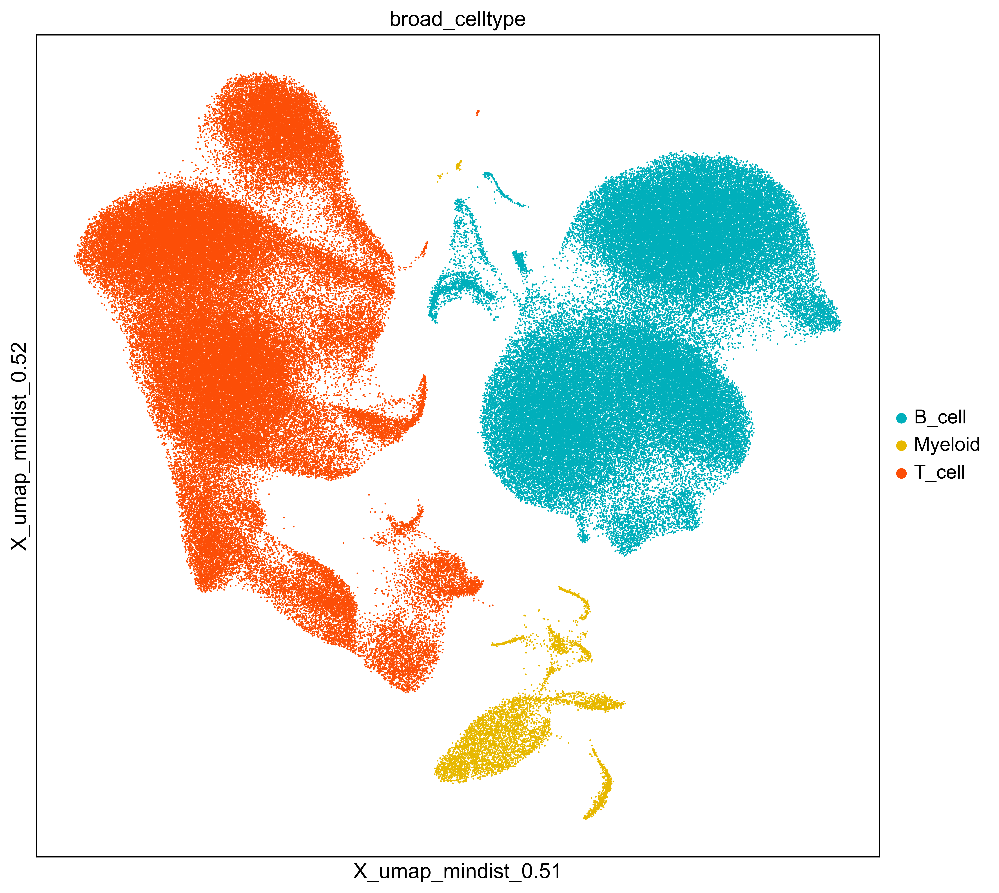

In [28]:
# UMAP with broad subsets
sc.set_figure_params(scanpy=True, dpi=300, dpi_save=300, frameon=True, vector_friendly=True, fontsize=14, figsize=[10,10], color_map=None, format='png', facecolor=None, transparent=False, ipython_format='png2x')
mu.pl.embedding(mdata['rna'], basis='X_umap_mindist_0.5', color="broad_celltype", ncols = 6, palette = palette_broadcelltype, size =5, save="UMAPall_broadcelltype.pdf")

# T cell

In [200]:
# Import
import_tcellmarkers = pd.read_csv("dotplot_markerorder_Tcells.csv", header =None)
import_tcellmarkers = import_tcellmarkers[0].tolist()
import_tcellmarkers = intersection(import_tcellmarkers, t_mdata['rna'].var.index.tolist())

import_tcelladtmarkers = pd.read_csv("dotplot_adtmarkerorder_Tcells.csv", header =None)
import_tcelladtmarkers = import_tcelladtmarkers[0].tolist()
import_tcelladtmarkers = intersection(import_tcelladtmarkers, t_mdata['prot'].var.index.tolist())

import_tcellorder = pd.read_csv("dotplot_cellorder_Tcells.csv")
import_tcellorder

,annotation,unicode_annotation,type
0,CD4_Naive,CD4⁺ naive T,CD4
1,CD4_Naive_SOX4pos,CD4⁺ SOX4⁺ naive T,CD4
2,CD4_ARHGAP15hi_MThi,CD4⁺ ARHGAP15ʰⁱ MTʰⁱ,CD4
3,CD4_BACH2hi_MThi,CD4⁺ BACH2ʰⁱ MTʰⁱ,CD4
4,CD4_CCR4hi,CD4⁺ CCR4ʰⁱ,CD4
5,CD4_CCR6hi,CD4⁺ CCR6ʰⁱ,CD4
6,CD4_CD69hi,CD4⁺ CD69ʰⁱ,CD4
7,CD4_CTLA4pos,CD4⁺ CTLA4⁺,CD4
8,CD4_Treg_Naive,CD4⁺ naive Treg,CD4
9,CD4_Treg_Memory,CD4⁺ memory Treg,CD4


In [122]:
# Colour Palette
tcellorder = pd.Series(import_tcellorder['unicode_annotation'])

tcell_palette = pd.read_csv("ColourPalette_FineCellType.csv", header =0)
tcell_palette = tcell_palette.drop(["index"], axis=1)
tcell_palette = tcell_palette.loc[tcell_palette['broad_celltype'] == "T_cell"]
tcell_palette = tcell_palette.set_index('celltype_final').loc[tcellorder].reset_index()
tcell_palette

,celltype_final,colour,celltype,broad_celltype
0,CD4⁺ naive T,#006FA6,CD4_Naive,T_cell
1,CD4⁺ SOX4⁺ naive T,#1B4400,CD4_Naive_SOX4pos,T_cell
2,CD4⁺ ARHGAP15ʰⁱ MTʰⁱ,#A30059,CD4_ARHGAP15hi_MThi,T_cell
3,CD4⁺ BACH2ʰⁱ MTʰⁱ,#B79762,CD4_BACH2hi_MThi,T_cell
4,CD4⁺ CCR4ʰⁱ,#008941,CD4_CCR4hi,T_cell
5,CD4⁺ CCR6ʰⁱ,#0000A6,CD4_CCR6hi,T_cell
6,CD4⁺ CD69ʰⁱ,#EEC3FF,CD4_CD69hi,T_cell
7,CD4⁺ CTLA4⁺,#997D87,CD4_CTLA4pos,T_cell
8,CD4⁺ naive Treg,#63FFAC,CD4_Treg_Naive,T_cell
9,CD4⁺ memory Treg,#FF34FF,CD4_Treg_Memory,T_cell


In [182]:
# Change cell order
t_mdata['rna'].obs['celltype_unicode'] = t_mdata['rna'].obs['celltype_unicode'].astype('category')
t_mdata['prot'].obs['celltype_unicode'] = t_mdata['prot'].obs['celltype_unicode'].astype('category')
t_mdata['rna'].obs['celltype_ordered'] = t_mdata['rna'].obs['celltype_unicode'].cat.set_categories(import_tcellorder['unicode_annotation'])
t_mdata['prot'].obs['celltype_ordered'] = t_mdata['prot'].obs['celltype_unicode'].cat.set_categories(import_tcellorder['unicode_annotation'])

C:\Users\jacquelines\anaconda3\envs\panpipes\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\jacquelines\anaconda3\envs\panpipes\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


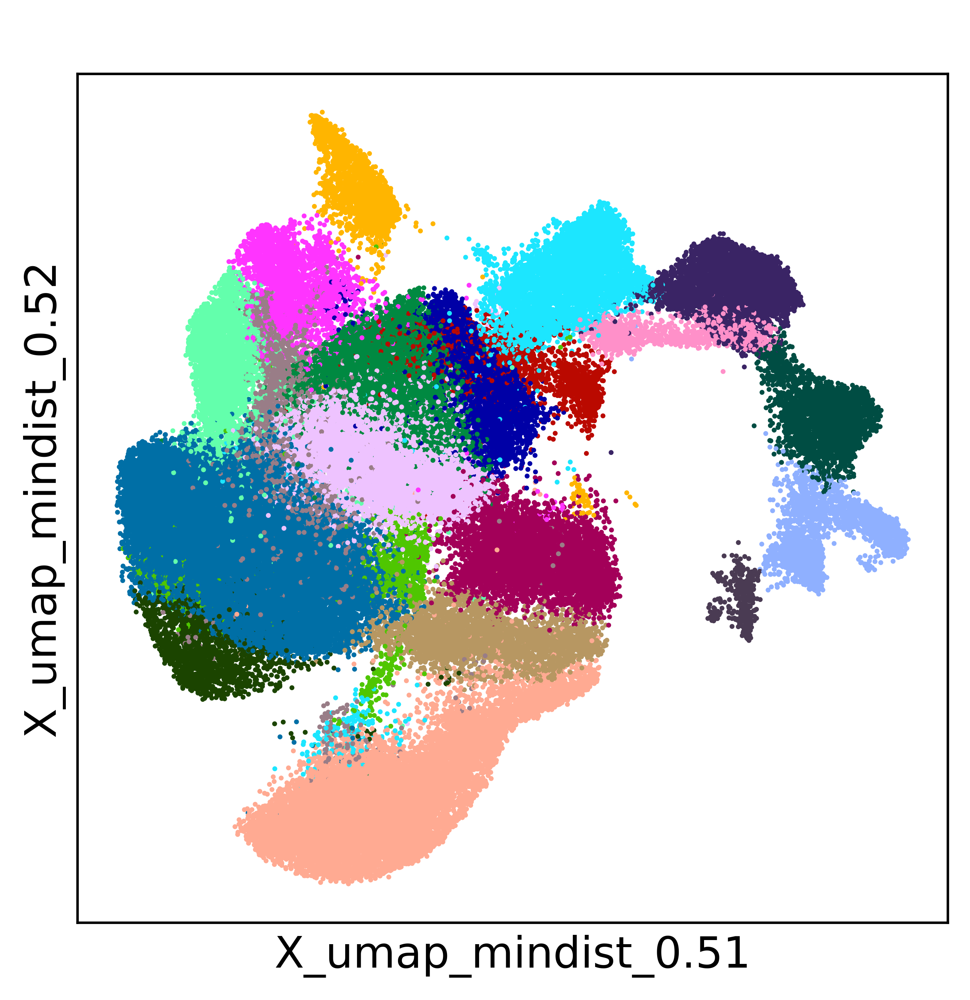

C:\Users\jacquelines\anaconda3\envs\panpipes\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\jacquelines\anaconda3\envs\panpipes\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


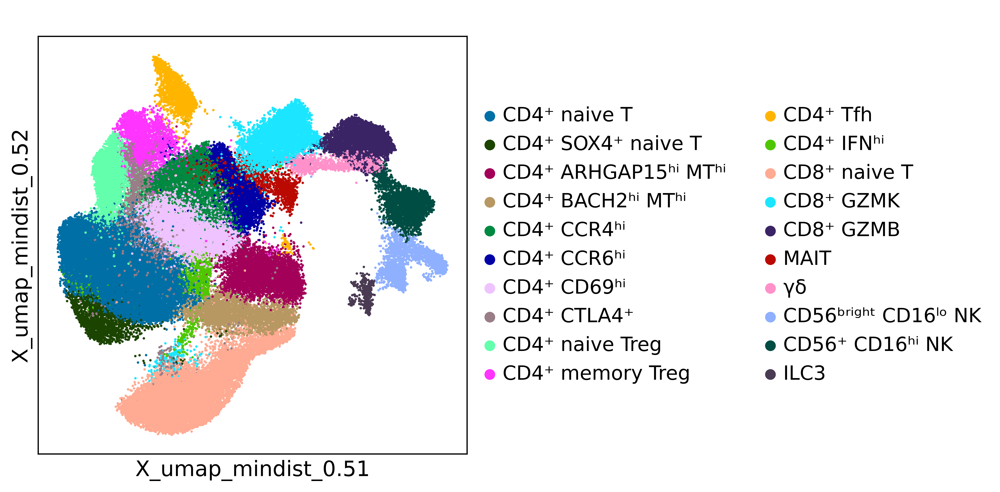

In [124]:
# UMAP
sc.set_figure_params(scanpy=True, dpi=300, dpi_save=300, frameon=True, vector_friendly=True, fontsize=14, figsize=[5,5], color_map=None, format='png', facecolor=None, transparent=False, ipython_format='png2x')
mu.pl.embedding(t_mdata['rna'], basis='X_umap_mindist_0.5', color="celltype_ordered", title = " ", ncols = 6, legend_loc = None, palette = tcell_palette['colour'].tolist(), size =10, save="UMAP_Tcell_finecelltype_nolegend.pdf")
mu.pl.embedding(t_mdata['rna'], basis='X_umap_mindist_0.5', color="celltype_ordered", title = " ", ncols = 6, palette = tcell_palette['colour'].tolist(), size =10, save="UMAP_Tcell_finecelltype.pdf")

C:\Users\jacquelines\anaconda3\envs\panpipes\lib\site-packages\scanpy\plotting\_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
C:\Users\jacquelines\anaconda3\envs\panpipes\lib\site-packages\scanpy\plotting\_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
C:\Users\jacquelines\anaconda3\envs\panpipes\lib\site-packages\scanpy\plotting\_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(

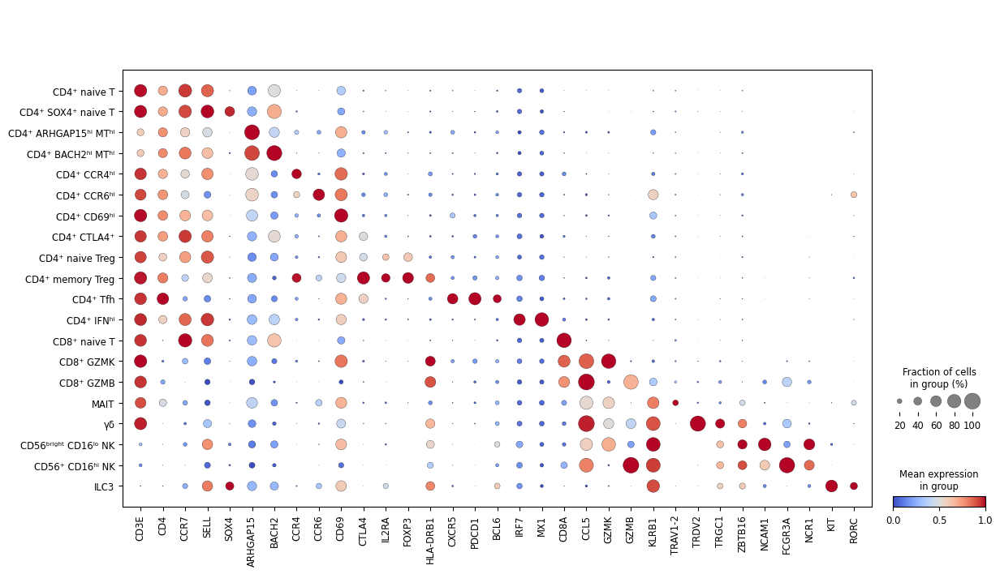

In [24]:
# RNA Dot plot
sc.pl.dotplot(
    t_mdata['rna'],
    groupby="celltype_ordered",
    var_names=import_tcellmarkers,
    standard_scale="var",  # standard scale: normalize each gene to range from 0 to 1
    dendrogram=False,
    #cmap = 'viridis',
    cmap='coolwarm',
    title = " ", 
    save="DotPlot_RNA_Tcell_RedBlue.pdf"
)

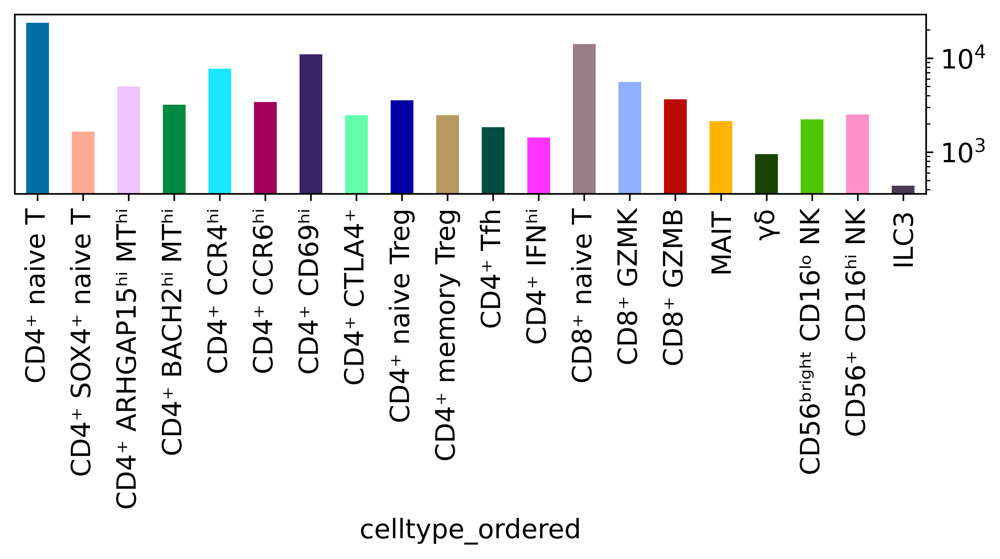

In [56]:
totalcounts_tcell = t_mdata['rna'].obs['celltype_ordered'].value_counts()

order = import_tcellorder['unicode_annotation'].tolist()
order

sc.set_figure_params(scanpy=True, dpi=300, dpi_save=300, frameon=True, vector_friendly=True, fontsize=13, figsize=None, color_map=None, format='pdf', facecolor=None, transparent=False, ipython_format='png2x')
fig = plt.figure()
ax = totalcounts_tcell.loc[order].plot.bar(x='celltype_ordered', y='dtype', rot="vertical", color=tcell_palette['colour'], grid = False, figsize = [7, 4], logy=True)
ax.yaxis.tick_right()
plt.tight_layout()
fig.savefig('figures/TotalCellCount_Tcells_finecelltype_log_orderedbycellorder.pdf', dpi = 300)

C:\Users\jacquelines\anaconda3\envs\panpipes\lib\site-packages\scanpy\plotting\_matrixplot.py:143: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  values_df = self.obs_tidy.groupby(level=0).mean()


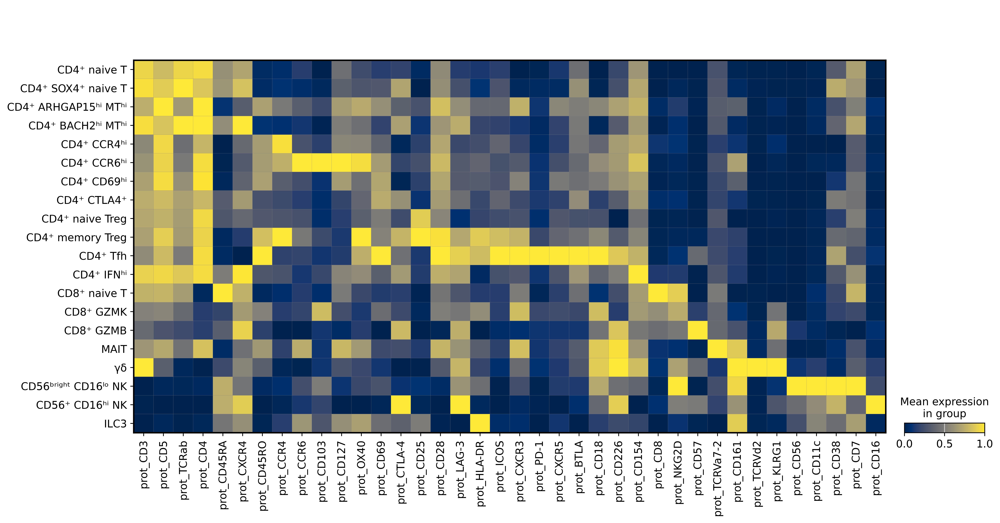

In [201]:
# ADT matrix plot
sc.pl.MatrixPlot(t_mdata['prot'], import_tcelladtmarkers, 
                 groupby='celltype_ordered', 
                 layer = 'dsb', 
                 standard_scale = 'var', 
                title = " ").style(cmap='cividis').savefig("figures/MatrixPlot_ADT_Tcells_scaledbyvar.pdf")

# B cell

In [7]:
# Import
import_bcellmarkers = pd.read_csv("dotplot_markerorder_Bcells.csv", header =None)
import_bcellmarkers = import_bcellmarkers[0].tolist()
import_bcellmarkers = intersection(import_bcellmarkers, b_mdata['rna'].var.index.tolist())

import_bcelladtmarkers = pd.read_csv("dotplot_adtmarkerorder_Bcells.csv", header =None)
import_bcelladtmarkers = import_bcelladtmarkers[0].tolist()
import_bcelladtmarkers = intersection(import_bcelladtmarkers, b_mdata['prot'].var.index.tolist())

import_bcellorder = pd.read_csv("dotplot_cellorder_Bcells.csv")

In [8]:
# Change cell order
b_mdata['rna'].obs['celltype_unicode'] = b_mdata['rna'].obs['celltype_unicode'].astype('category')
b_mdata['prot'].obs['celltype_unicode'] = b_mdata['prot'].obs['celltype_unicode'].astype('category')
b_mdata['rna'].obs['celltype_ordered'] = b_mdata['rna'].obs['celltype_unicode'].cat.set_categories(import_bcellorder['unicode_annotation'])
b_mdata['prot'].obs['celltype_ordered'] = b_mdata['prot'].obs['celltype_unicode'].cat.set_categories(import_bcellorder['unicode_annotation'])

In [9]:
# Colour Palette
bcellorder = pd.Series(import_bcellorder['unicode_annotation'])

bcell_palette = pd.read_csv("ColourPalette_FineCellType.csv", header =0)
bcell_palette = bcell_palette.drop(["index"], axis=1)
bcell_palette = bcell_palette.loc[bcell_palette['broad_celltype'] == "B_cell"]
bcell_palette = bcell_palette.set_index('celltype_final').loc[bcellorder].reset_index()
bcell_palette

,celltype_final,colour,celltype,broad_celltype
0,TS/pre B,#0089A3,B_preTS,B_cell
1,Naive B,#D16100,B_Naive,B_cell
2,Naive FOXP1ʰⁱ B,#99ADC0,B_Naive_FOXP1hi,B_cell
3,IFITM1ʰⁱ B,#FF2F80,B_IFITM1hi,B_cell
4,GC LZ B,#922329,B_GC_LZ,B_cell
5,GC DZ B,#00C2A0,B_GC_DZ,B_cell
6,DN MTʰⁱ B,#6B7900,B_DN_MThi,B_cell
7,MZ B,#0AA6D8,B_MZB,B_cell
8,CSM B,#61615A,B_CSM,B_cell
9,Plasma cell,#B903AA,B_PC,B_cell


C:\Users\jacquelines\anaconda3\envs\panpipes\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\jacquelines\anaconda3\envs\panpipes\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


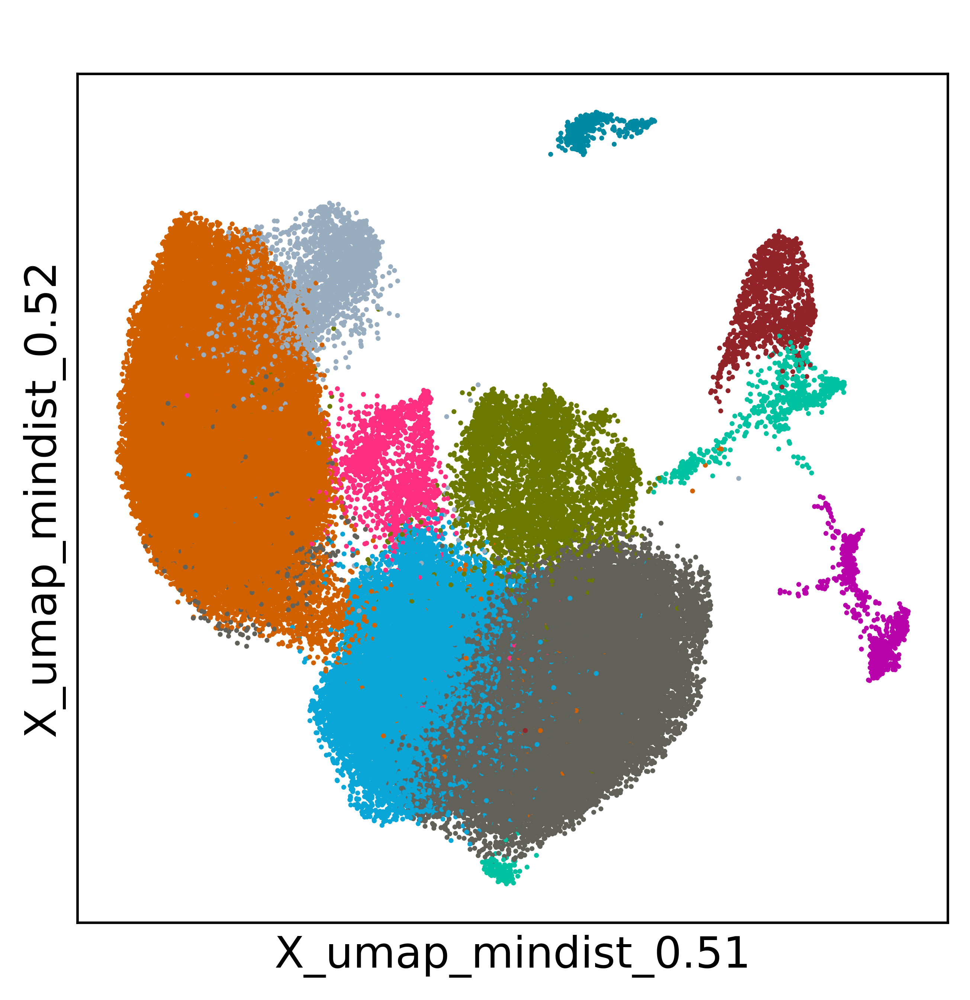

C:\Users\jacquelines\anaconda3\envs\panpipes\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\jacquelines\anaconda3\envs\panpipes\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


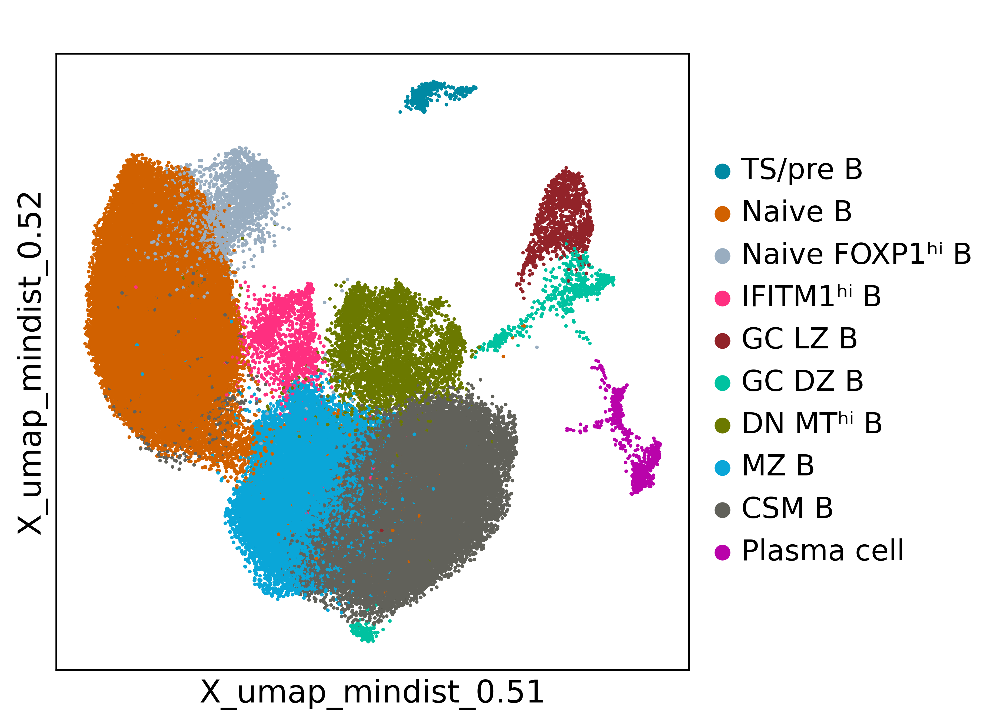

In [139]:
# UMAP
sc.set_figure_params(scanpy=True, dpi=300, dpi_save=300, frameon=True, vector_friendly=True, fontsize=14, figsize=[5,5], color_map=None, format='png', facecolor=None, transparent=False, ipython_format='png2x')
mu.pl.embedding(b_mdata['rna'], basis='X_umap_mindist_0.5', color="celltype_ordered", title = " ", ncols = 6, legend_loc = None, palette = bcell_palette['colour'].tolist(), size =10, save="UMAP_Bcell_finecelltype_nolegend.pdf")
mu.pl.embedding(b_mdata['rna'], basis='X_umap_mindist_0.5', color="celltype_ordered", title = " ", ncols = 6, palette = bcell_palette['colour'].tolist(), size =10, save="UMAP_Bcell_finecelltype.pdf")

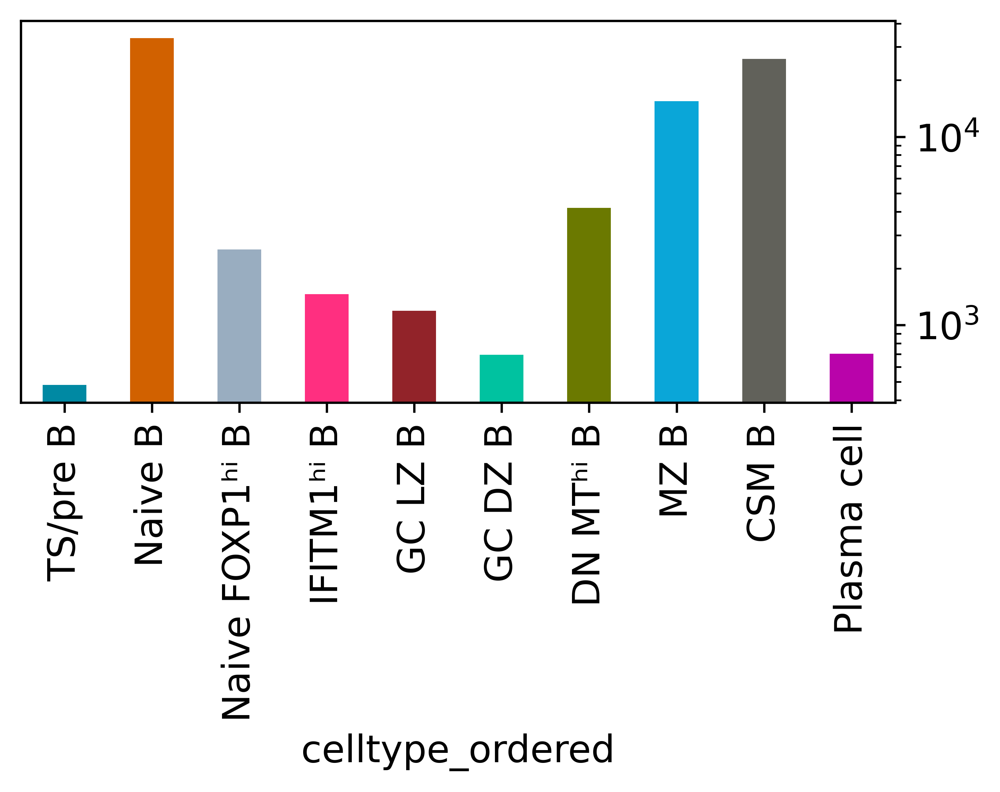

In [140]:
totalcounts_bcell = b_mdata['rna'].obs['celltype_ordered'].value_counts()

order = import_bcellorder['unicode_annotation'].tolist()
order

sc.set_figure_params(scanpy=True, dpi=300, dpi_save=300, frameon=True, vector_friendly=True, fontsize=13, figsize=None, color_map=None, format='pdf', facecolor=None, transparent=False, ipython_format='png2x')
fig = plt.figure()
ax = totalcounts_bcell.loc[order].plot.bar(x='celltype_ordered', y='dtype', rot="vertical", color=bcell_palette['colour'], grid = False, figsize = [5, 4], logy=True)
ax.yaxis.tick_right()
plt.tight_layout()
fig.savefig('figures/TotalCellCount_Bcells_finecelltype_log_orderedbycellorder.pdf', dpi = 300)

C:\Users\jacquelines\anaconda3\envs\panpipes\lib\site-packages\scanpy\plotting\_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
C:\Users\jacquelines\anaconda3\envs\panpipes\lib\site-packages\scanpy\plotting\_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
C:\Users\jacquelines\anaconda3\envs\panpipes\lib\site-packages\scanpy\plotting\_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(

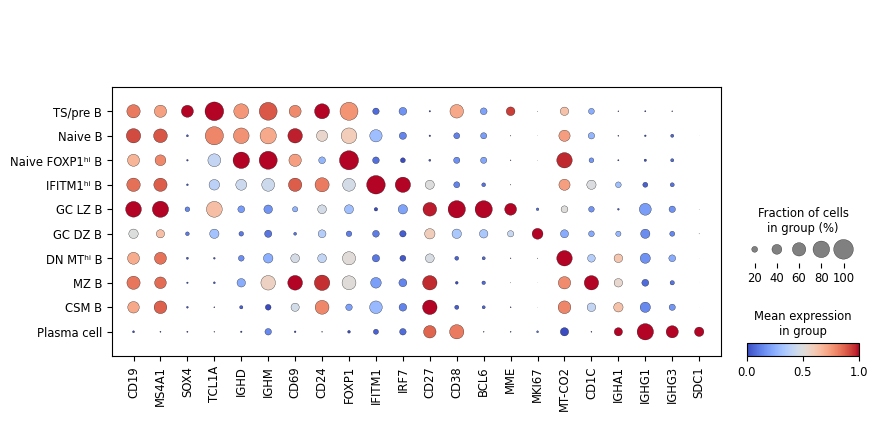

In [19]:
sc.pl.dotplot(
    b_mdata['rna'],
    groupby="celltype_ordered",
    var_names=import_bcellmarkers,
    standard_scale="var",  # standard scale: normalize each gene to range from 0 to 1
    dendrogram=False,
    #cmap = 'viridis',
    cmap='coolwarm',
    title = " ", 
    save="DotPlot_RNA_Bcell_RedBlue.pdf"
)

C:\Users\jacquelines\anaconda3\envs\panpipes\lib\site-packages\scanpy\plotting\_matrixplot.py:143: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  values_df = self.obs_tidy.groupby(level=0).mean()


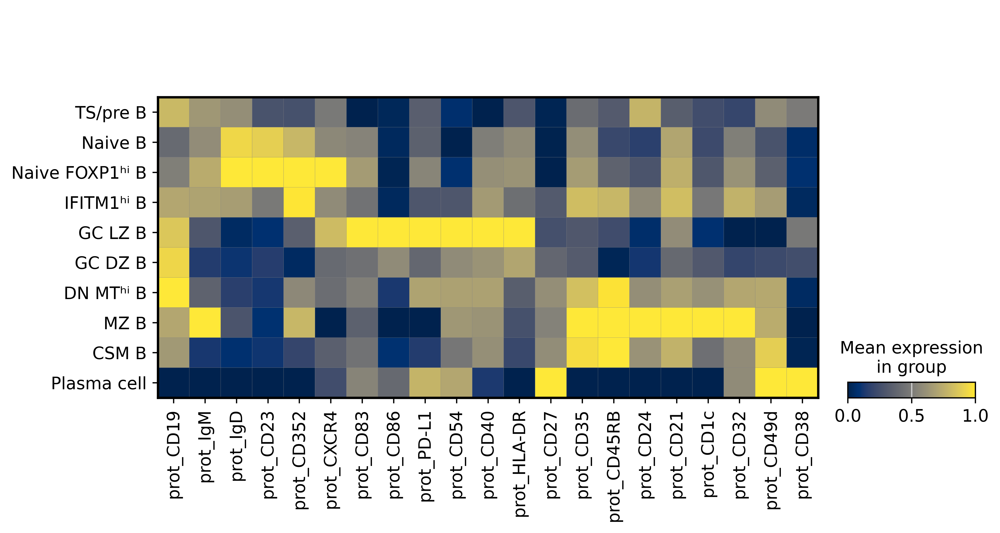

In [180]:
# ADT matrix plot
sc.pl.MatrixPlot(b_mdata['prot'], import_bcelladtmarkers, 
                 groupby='celltype_ordered', 
                 layer = 'dsb', 
                 standard_scale = 'var', 
                title = " ").style(cmap='cividis').savefig("figures/MatrixPlot_ADT_Bcells_scaledbyvar.pdf")

# Non T & B

In [171]:
# Import
import_mcellmarkers = pd.read_csv("dotplot_markerorder_Myeloid.csv", header =None)
import_mcellmarkers = import_mcellmarkers[0].tolist()

import_mcelladtmarkers = pd.read_csv("dotplot_adtmarkerorder_Myeloid.csv", header =None)
import_mcelladtmarkers = import_mcelladtmarkers[0].tolist()
import_mcelladtmarkers = intersection(import_mcelladtmarkers, m_mdata['prot'].var.index.tolist())

import_mcellorder = pd.read_csv("dotplot_cellorder_Myeloid.csv")

In [154]:
# Change cell order
m_mdata['rna'].obs['celltype_unicode'] = m_mdata['rna'].obs['celltype_unicode'].astype('category')
m_mdata['prot'].obs['celltype_unicode'] = m_mdata['prot'].obs['celltype_unicode'].astype('category')
m_mdata['rna'].obs['celltype_ordered'] = m_mdata['rna'].obs['celltype_unicode'].cat.set_categories(import_mcellorder['unicode_annotation'])
m_mdata['prot'].obs['celltype_ordered'] = m_mdata['prot'].obs['celltype_unicode'].cat.set_categories(import_mcellorder['unicode_annotation'])

In [155]:
# Colour Palette
mcellorder = pd.Series(import_mcellorder['unicode_annotation'])

mcell_palette = pd.read_csv("ColourPalette_FineCellType.csv", header =0)
mcell_palette = mcell_palette.drop(["index"], axis=1)
mcell_palette = mcell_palette.loc[mcell_palette['broad_celltype'] == "Myeloid"]
mcell_palette = mcell_palette.set_index('celltype_final').loc[mcellorder].reset_index()
mcell_palette

,celltype_final,colour,celltype,broad_celltype
0,CD14⁺ mono,#00489C,CD14pos_monocyte,Myeloid
1,CD16⁺ mono,#A4E804,FCGR3Apos_monocyte,Myeloid
2,C1QA⁺ NRP1ʰⁱ macro,#FF913F,C1QAposNRP1hi_macrophage,Myeloid
3,C1QA⁺ macro,#00A6AA,C1QApos_macrophage,Myeloid
4,XCR1⁺ DC,#00846F,XCR1pos_DC,Myeloid
5,CD1C⁺ DC,#C0B9B2,CD1Cpos_DC,Myeloid
6,Ribosomalʰⁱ DC,#D157A0,RiboHi_DC,Myeloid
7,LAMP3⁺ DC,#A1C299,LAMP3pos_DC,Myeloid
8,LAMP3⁺ IRF7⁺ DC,#7900D7,LAMP3posIRF7pos_DC,Myeloid
9,pDC,#A079BF,pDC,Myeloid


C:\Users\jacquelines\anaconda3\envs\panpipes\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\jacquelines\anaconda3\envs\panpipes\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


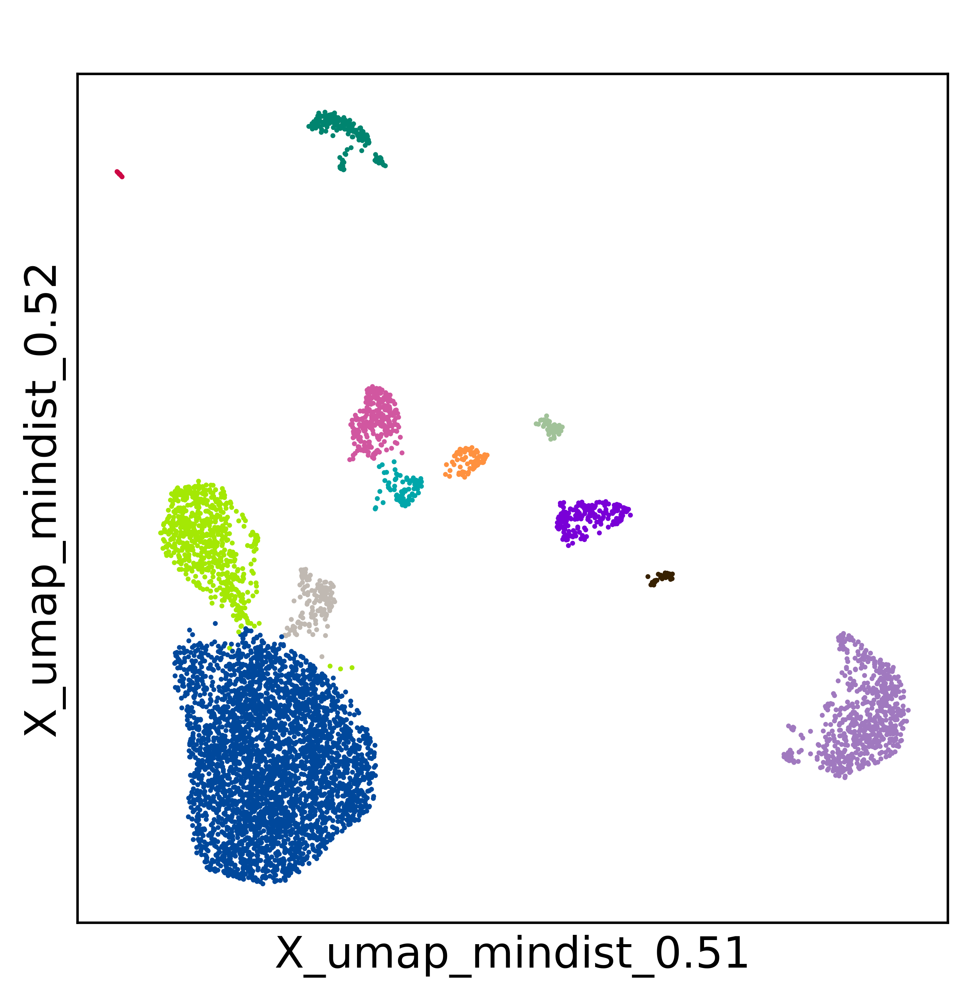

C:\Users\jacquelines\anaconda3\envs\panpipes\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\jacquelines\anaconda3\envs\panpipes\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


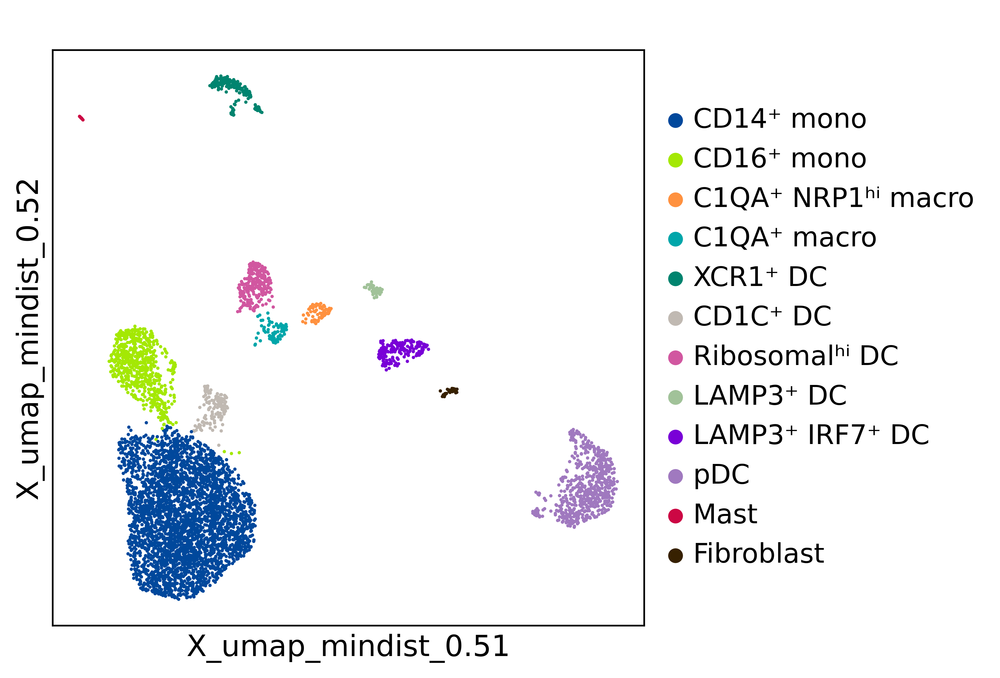

In [146]:
# UMAP
sc.set_figure_params(scanpy=True, dpi=300, dpi_save=300, frameon=True, vector_friendly=True, fontsize=14, figsize=[5,5], color_map=None, format='png', facecolor=None, transparent=False, ipython_format='png2x')
mu.pl.embedding(m_mdata['rna'], basis='X_umap_mindist_0.5', color="celltype_ordered", title = " ", ncols = 6, legend_loc = None, palette = mcell_palette['colour'].tolist(), size =10, save="UMAP_NonTBcell_finecelltype_nolegend.pdf")
mu.pl.embedding(m_mdata['rna'], basis='X_umap_mindist_0.5', color="celltype_ordered", title = " ", ncols = 6, palette = mcell_palette['colour'].tolist(), size =10, save="UMAP_NonTBcell_finecelltype.pdf")

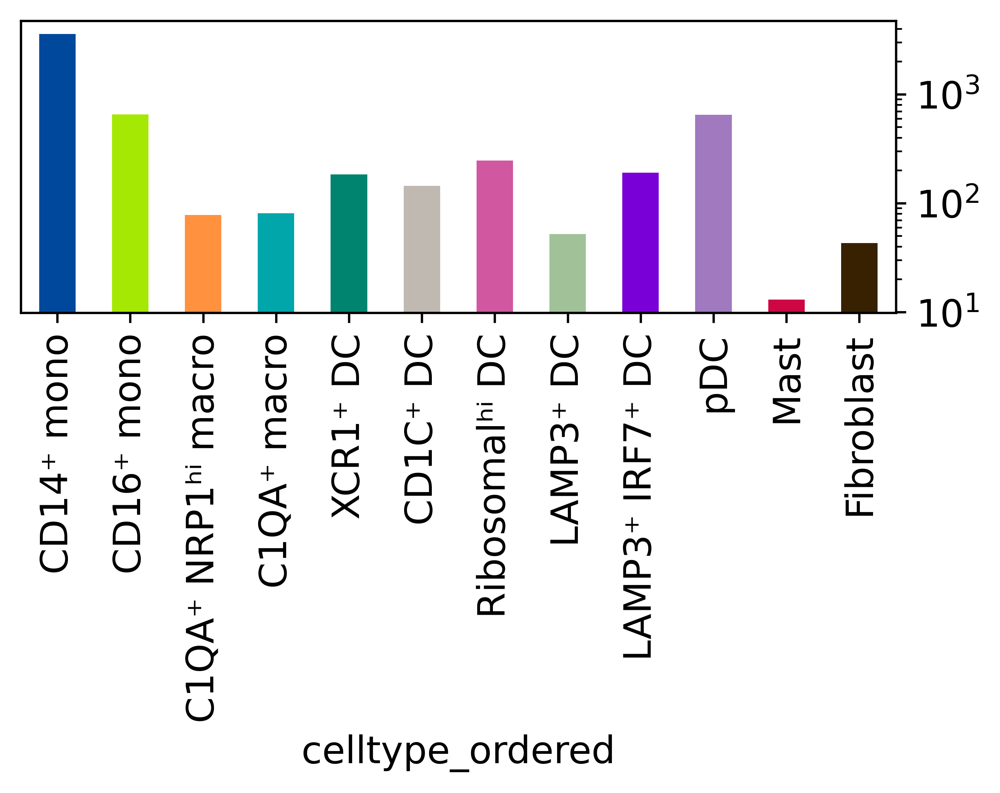

In [147]:
totalcounts_mcell = m_mdata['rna'].obs['celltype_ordered'].value_counts()

order = import_mcellorder['unicode_annotation'].tolist()
order

sc.set_figure_params(scanpy=True, dpi=300, dpi_save=300, frameon=True, vector_friendly=True, fontsize=13, figsize=None, color_map=None, format='pdf', facecolor=None, transparent=False, ipython_format='png2x')
fig = plt.figure()
ax = totalcounts_mcell.loc[order].plot.bar(x='celltype_ordered', y='dtype', rot="vertical", color=mcell_palette['colour'], grid = False, figsize = [5, 4], logy=True)
ax.yaxis.tick_right()
plt.tight_layout()
fig.savefig('figures/TotalCellCount_NonTBcells_finecelltype_log_orderedbycellorder.pdf', dpi = 300)

C:\Users\jacquelines\anaconda3\envs\panpipes\lib\site-packages\scanpy\plotting\_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
C:\Users\jacquelines\anaconda3\envs\panpipes\lib\site-packages\scanpy\plotting\_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
C:\Users\jacquelines\anaconda3\envs\panpipes\lib\site-packages\scanpy\plotting\_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(

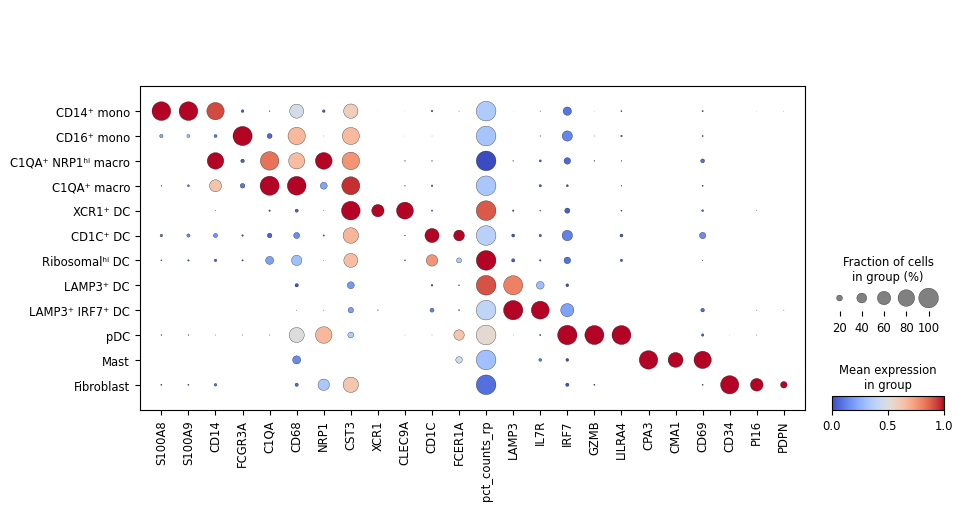

In [49]:
sc.pl.dotplot(
    m_mdata['rna'],
    groupby="celltype_ordered",
    var_names=import_mcellmarkers,
    standard_scale="var",  # standard scale: normalize each gene to range from 0 to 1
    dendrogram=False,
    #cmap = 'viridis',
    cmap='coolwarm',
    title = " ", 
    save="DotPlot_RNA_Myeloid_RedBlue.pdf"
)

C:\Users\jacquelines\anaconda3\envs\panpipes\lib\site-packages\scanpy\plotting\_matrixplot.py:143: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  values_df = self.obs_tidy.groupby(level=0).mean()


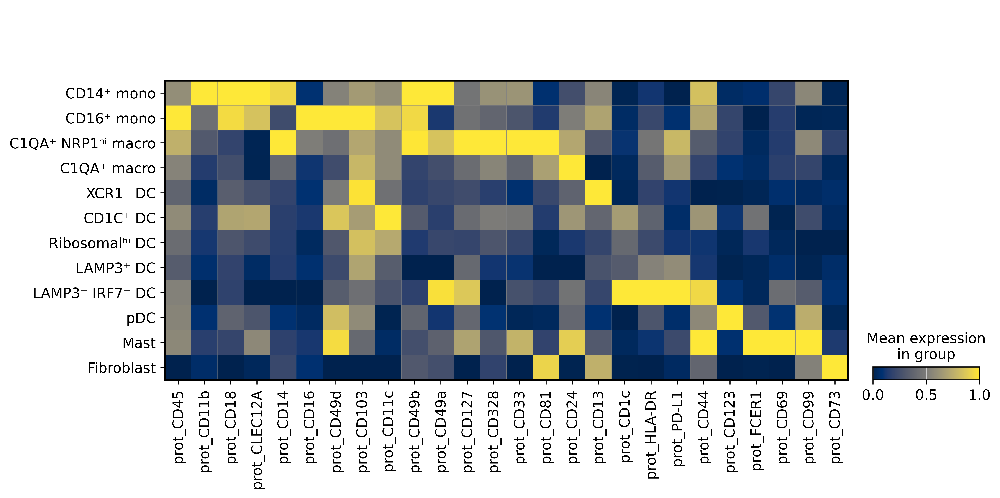

In [172]:
# ADT matrix plot
sc.pl.MatrixPlot(m_mdata['prot'], import_mcelladtmarkers, 
                 groupby='celltype_ordered', 
                 layer = 'dsb', 
                 standard_scale = 'var', 
                title = " ").style(cmap='cividis').savefig("figures/MatrixPlot_ADT_NonTBcells_scaledbyvar.pdf")